# Neighbors using Different Distance Metrics

Try a different metric: 1) Distance projected on n most distinctive dimensions. Given a set of images what is the most distinctive feature directions? Using the new set of skewed features, are the nearest neighbors different? - ** average direction and largest components of the average ** 2) If 1. is promissing, using the algorithm in david's paper

# Top-k largest components of the feature vecture

Given a set of images, obtain the most distinctive feature directions by taking the average over the set of images and taking the largest directional components to compute the nearest distances

## Set up 

In [10]:
import os, random, sys, torch
import matplotlib.pyplot as plt
from CMC.models.resnet import InsResNet50
from CMC.models.LinearModel import LinearClassifierResNet
from CMC.quickdataset import QuickImageFolder
from netdissect import renormalize, show
import numpy as np
import pickle
from PIL import Image
from torchvision import transforms


In [11]:
dataset = "imagenet"
epoch = 240

In [12]:
folder_path = "../CMC/CMC_data/{}_models".format(dataset)
model_name = "/{}_MoCo0.999_softmax_16384_resnet50_lr_0.03_decay_0.0001_bsz_128_crop_0.2_aug_CJ".format(dataset)
epoch_name = "/ckpt_epoch_{}.pth".format(epoch)
my_path = folder_path + model_name + epoch_name
if dataset == "imagenet":
    data_path =  "/data/vision/torralba/datasets/imagenet_pytorch"
else:
    data_path = "/data/vision/torralba/datasets/places/places365_standard/places365standard_easyformat"
val_folder = data_path + "/val"

In [13]:
crop = 0.2
crop_padding = 32
batch_size = 30
num_workers = 24
train_sampler = None
moco = True
gpu = 0
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

image_size = 224
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
normalize = transforms.Normalize(mean=mean, std=std)

In [14]:
val_transform = transforms.Compose([
                    transforms.Resize(image_size + crop_padding),
                    transforms.CenterCrop(image_size),
                    transforms.ToTensor(),
                    normalize,
                ])

val_dataset = QuickImageFolder(val_folder, transform=val_transform, two_crop=moco)

Making fast dataset ...  /data/vision/torralba/datasets/imagenet_pytorch/val
Walking image files ... 
from index file:  /data/vision/torralba/datasets/imagenet_pytorch/val.txt


In [15]:
val_loader = torch.utils.data.DataLoader(
                val_dataset, batch_size=batch_size, 
                shuffle=False, num_workers=num_workers, pin_memory=True)

### Load the latest model from the checkpoint

In [16]:
model = InsResNet50()
model_ema = InsResNet50()
checkpoint = torch.load(my_path)
model.load_state_dict(checkpoint['model'])
model_ema.load_state_dict(checkpoint['model_ema'])
model.cuda()
model_ema.cuda()
print("Loaded model from ... ", my_path)

Loaded model from ...  ../CMC/CMC_data/imagenet_models/imagenet_MoCo0.999_softmax_16384_resnet50_lr_0.03_decay_0.0001_bsz_128_crop_0.2_aug_CJ/ckpt_epoch_240.pth


### Load the feature dictionary

In [20]:
from CMC.image_helper import *

In [21]:
pickle_path = "../CMC/CMC_data/pkl"
path_to_feat = pickle_path + "/{}_val_to_feat_epoch{}".format(dataset, epoch)
feat_dict = load_obj(path_to_feat)

==> Loading file ... ../CMC/CMC_data/pkl/imagenet_val_to_feat_epoch240


## Toy Example: Extract top-k largest features
### Grouping Images
Consider the below set of images that are hand-picked.

In [22]:
from CMC.nearest_neighbor_helper import *

In [30]:
qid = 3031
neighbors = get_nearest_neighbor_idx(qid, feat_dict, n=16)
indices = [_[0] for _ in neighbors]

idx list [3031, 36917, 3148, 6914, 33584, 29214, 26543, 17674, 23242, 2309, 4940, 36054, 27452, 2130, 14685, 19886]



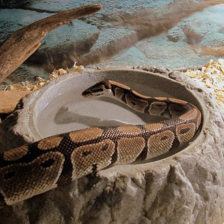
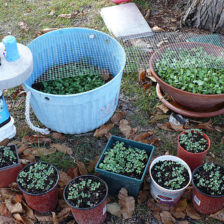
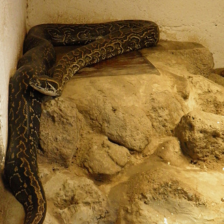
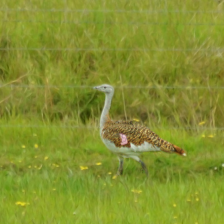
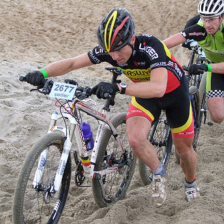
...
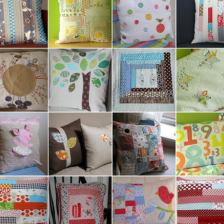
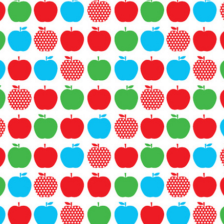
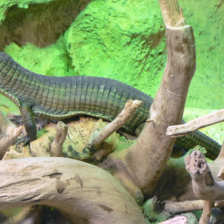
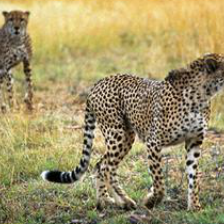
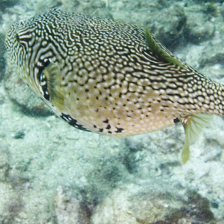

In [76]:
show_idx(indices, val_dataset)

idx list [3031, 17674]



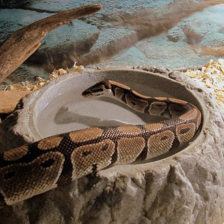
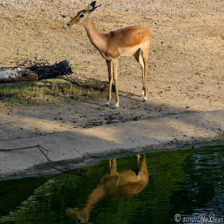

idx list [3031, 3148, 23242, 2309, 2130]



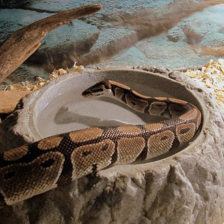
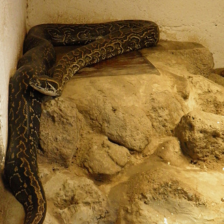
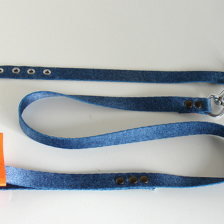
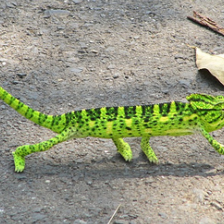
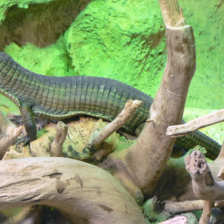

idx list [2309, 27452, 14685, 19886]



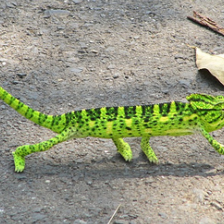
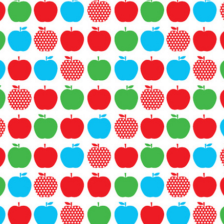
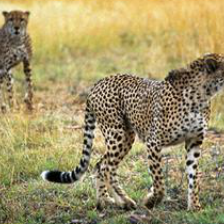
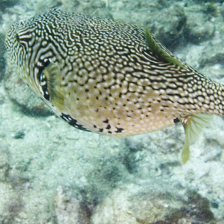

idx list [3031, 36917, 33584, 29214]



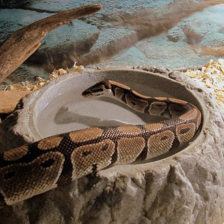
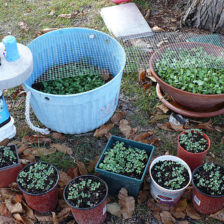
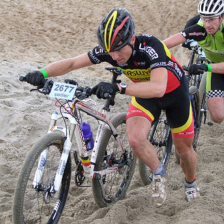
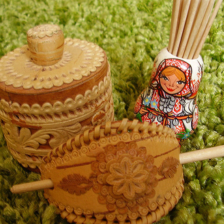

In [33]:
reflection = [indices[i] for i in [0,7]]
snake = [indices[i] for i in [0,2,8,9,13]]
pattern = [indices[i] for i in [9,12,14,15]]
circle = [indices[i] for i in [0,1,4,5]]

show_idx(reflection, val_dataset)
show_idx(snake, val_dataset)
show_idx(pattern, val_dataset)
show_idx(circle, val_dataset)

## K - largest direction

What are the k-largest average direction for each group?

In [68]:
def get_new_neighbor_idx(query_idx, feature_dict, topk_idx, n=10):
    """ Get the index of n nearest neighbors to query 
    according to the feature dictionary
    The first image is the query image """
    neighbors = {}
    q_feat = feature_dict[query_idx]
    q_feat = [q_feat[j] for j in topk_idx]
    for idx, feat in feature_dict.items():
        feat = [feat[j] for j in topk_idx]
        neighbors[idx] = np.dot(feat, q_feat)
    neighbors = sorted(neighbors.items(), key=lambda x:x[1], reverse=True)
    return neighbors[:n]

In [70]:
groups = {"reflection": reflection, 
          "snake": snake, 
          "pattern": pattern, 
          "circle": circle}

reflection  dir idx: [5, 126, 14, 86, 29]
idx list [3031, 39370, 27738, 4940, 39645, 17674, 19649, 30198, 1221, 3564, 34882, 1336]



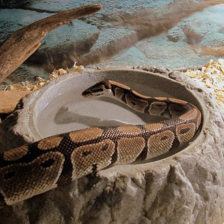
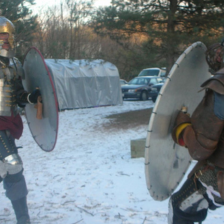
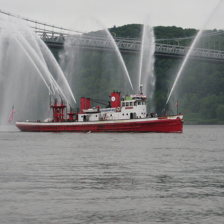
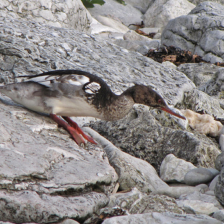
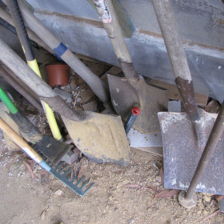
...
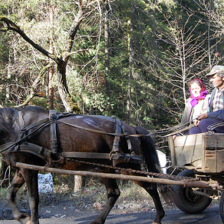
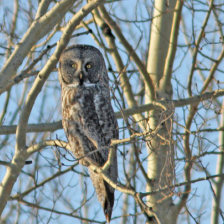
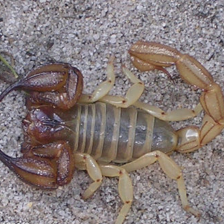
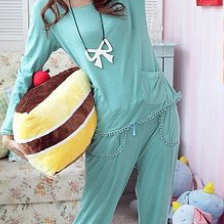
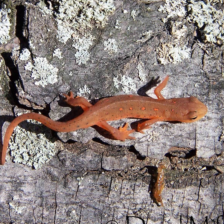

snake  dir idx: [126, 14, 86, 5, 13]
idx list [3031, 1221, 39370, 27738, 23630, 25221, 39503, 33578, 40054, 33850, 41445, 19649]



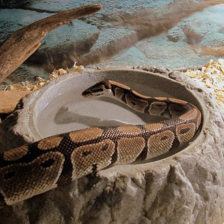
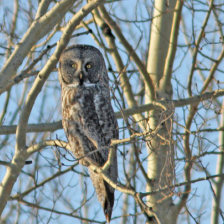
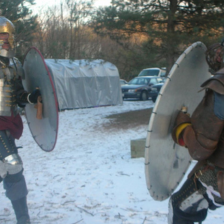
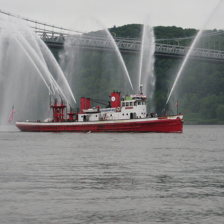
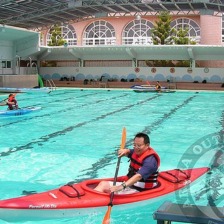
...
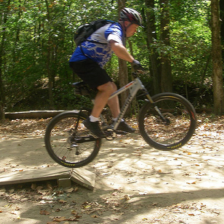
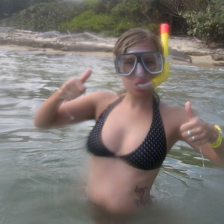
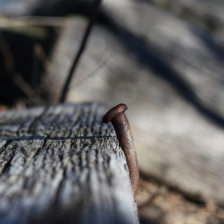
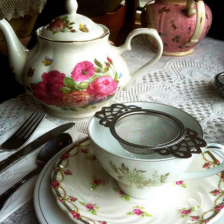
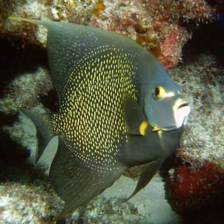

pattern  dir idx: [72, 126, 27, 13, 61]
idx list [14429, 19886, 4321, 45906, 40828, 47273, 23630, 3031, 26963, 40836, 29144, 33747]



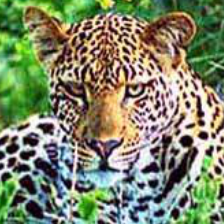
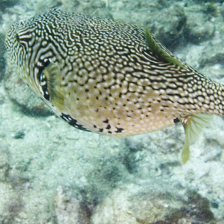
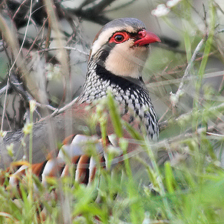
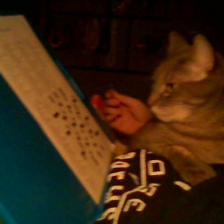
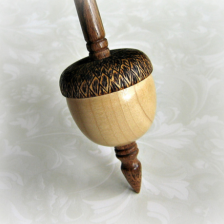
...
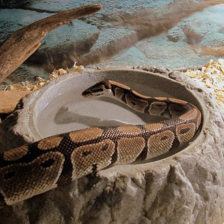
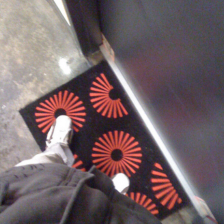
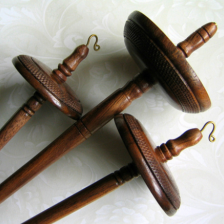
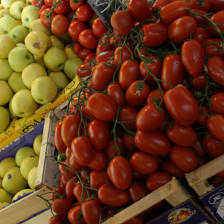
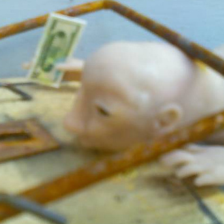

circle  dir idx: [5, 86, 13, 29, 54]
idx list [3031, 47269, 19649, 36363, 5706, 3564, 26120, 34495, 31909, 39551, 46854, 37423]



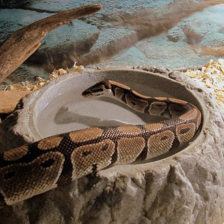
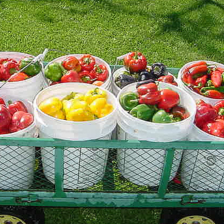
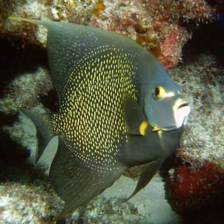
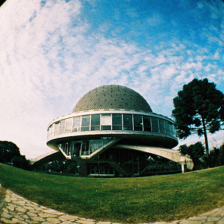
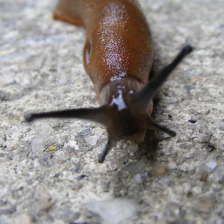
...
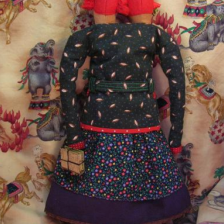
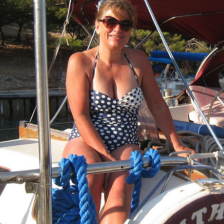
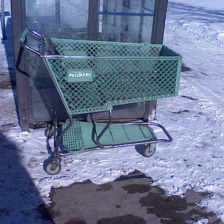
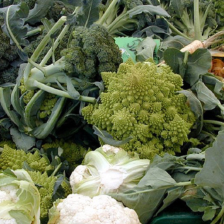
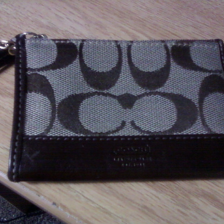

In [74]:
for name, g in groups.items():
    k = 5
    sum_ = sum([feat_dict[i] for i in g])
    avg = np.average(sum_)
    abs_ = np.abs(sum_ - avg)
    sorted_ = sorted([(i,n) for i,n in enumerate(abs_)], \
                     key=lambda x:x[1], reverse=True)
    dir_idx = [_[0] for _ in sorted_[:k]]
    print("{}  dir idx: {}".format(name, dir_idx))
    new_neighbors = get_new_neighbor_idx(qid, feat_dict, dir_idx, n=12)
    new_indx = [_[0] for _ in new_neighbors]
    show_idx(new_indx, val_dataset)

reflection  dir idx: [5, 126, 14, 86, 29, 34, 59, 90, 7, 107]
idx list [3031, 17674, 3588, 10993, 4, 4940, 40336, 3564, 17487, 1336, 25001, 36171]



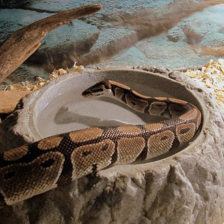
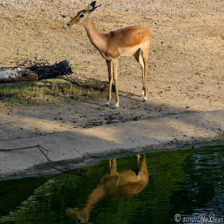
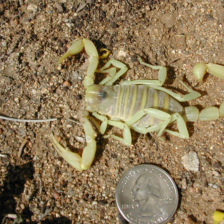
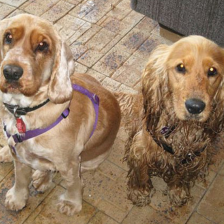
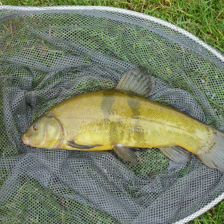
...
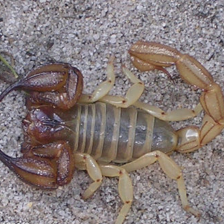
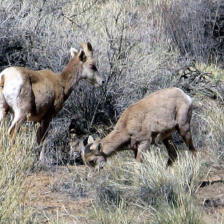
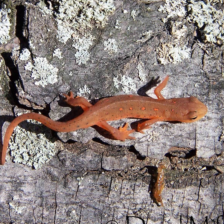
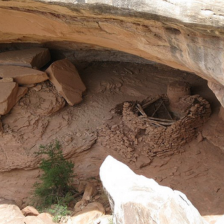
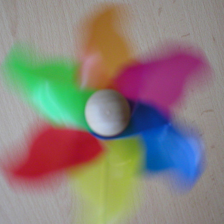

snake  dir idx: [126, 14, 86, 5, 13, 25, 81, 61, 98, 99]
idx list [3031, 1221, 33584, 2130, 19649, 39551, 2090, 44772, 39370, 1365, 21672, 27308]



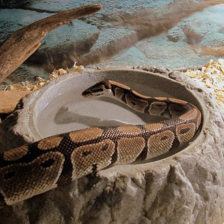
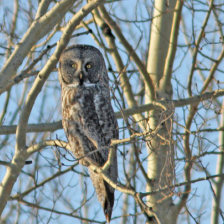
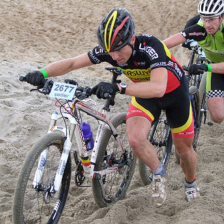
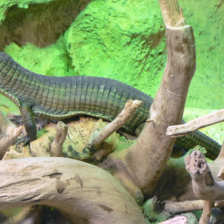
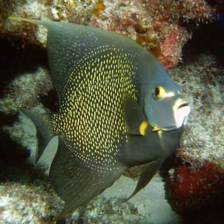
...
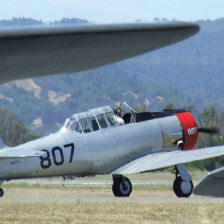
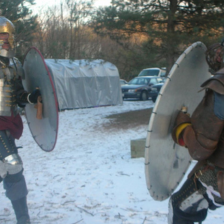
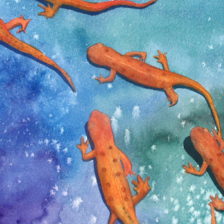
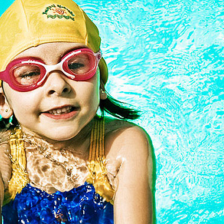
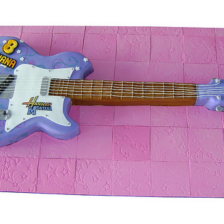

pattern  dir idx: [72, 126, 27, 13, 61, 86, 5, 79, 88, 11]
idx list [3031, 19649, 19886, 14685, 1221, 31909, 27452, 25221, 40836, 534, 33850, 19888]



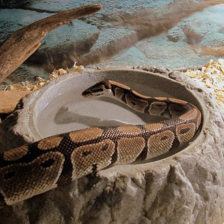
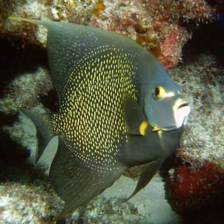
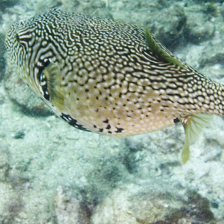
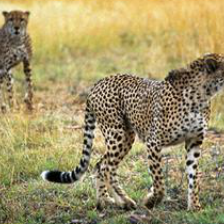
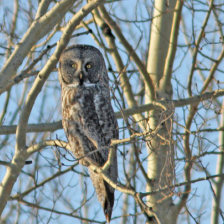
...
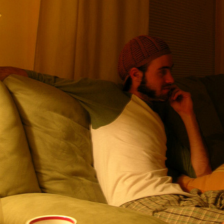
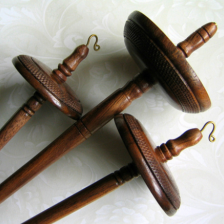
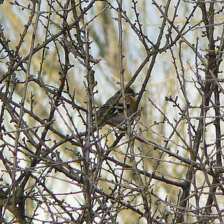
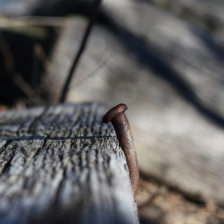
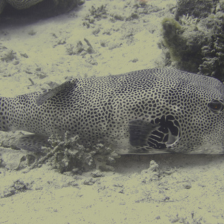

circle  dir idx: [5, 86, 13, 29, 54, 91, 98, 126, 61, 68]
idx list [3031, 36917, 33584, 23242, 19649, 36150, 23611, 21578, 41423, 40336, 27243, 38540]



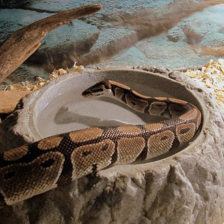
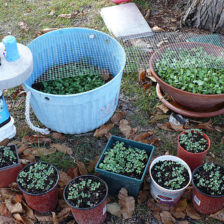
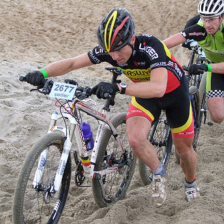
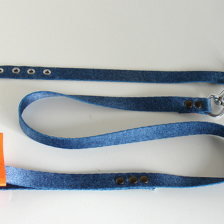
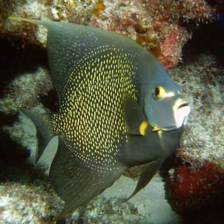
...
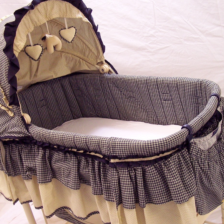
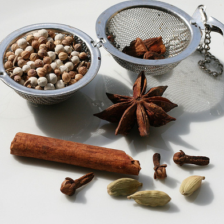
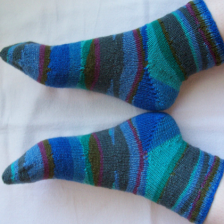
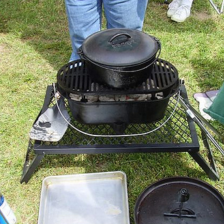
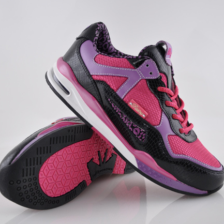

In [75]:
for name, g in groups.items():
    k = 10
    sum_ = sum([feat_dict[i] for i in g])
    avg = np.average(sum_)
    abs_ = np.abs(sum_ - avg)
    sorted_ = sorted([(i,n) for i,n in enumerate(abs_)], \
                     key=lambda x:x[1], reverse=True)
    dir_idx = [_[0] for _ in sorted_[:k]]
    print("{}  dir idx: {}".format(name, dir_idx))
    new_neighbors = get_new_neighbor_idx(qid, feat_dict, dir_idx, n=12)
    new_indx = [_[0] for _ in new_neighbors]
    show_idx(new_indx, val_dataset)

In [ ]:
new_feature = [feat_dict[i][j] for f in dir_idx]


## Helper Functions

## Most "similar" images within the validation set

In [ ]:
wednesday_path = "/data/vision/torralba/scratch/yyou/wednesday/nearest_neighbors"

In [ ]:
import random

n=50
for i in range(10):
    q_idx = random.randint(0,len(val_dataset)-1)
    nearest_idx = get_nearest_neighbor_idx(q_idx, dval_feat, n=n)
    nearest_img = [split_img(val_dataset[idx][0]) for idx,score in nearest_idx]
    imsave(nearest_img, wednesday_path+"/epoch{}_query{}_neighbors_{}".format(epoch, q_idx, n))

## What are the distribution of differences like?

In [ ]:
quick_all_distance_distribution(dval_feat, val_dataset)

## What are the images that have most similar images?

### Many neighbors with high similarity

In [ ]:
indices, neighbor, dist = indices_with_extreme_neighbors(dval_feat, val_dataset, f=lambda x:x>0.7, n=12, howmany=1)

In [ ]:
for i in range(1):
    print("average dot prod amongst 12 neighbors is : ", np.mean(dist[i]))
    print(dist[i])
    show_idx([indices[i]]+list(neighbor[i]))

In [ ]:
distance_distribution_for_id(49766, dval_feat, val_dataset)

### The top neighbors have highest similarity

In [ ]:
indices, neighbor, dist = indices_with_extreme_neighbors(dval_feat, val_dataset, f=lambda x:x>0.77, n=4, howmany=1)

In [ ]:
for i in range(1):
    print("average dot prod amongst 12 neighbors is : ", np.mean(dist[i]))
    print(dist[i])
    show_idx([indices[i]]+list(neighbor[i]))

## What are the images that have least similar images?

### Many neighbors with generally low similarity

In [ ]:
indices, neighbor, dist = indices_with_extreme_neighbors(dval_feat, val_dataset, f=lambda x:x<0.4, n=12, howmany=1)
for i in range(1):
    print("average dot prod amongst 12 neighbors is : ", np.mean(dist[i]))
    print(dist[i])
    show_idx([indices[i]]+list(neighbor[i]))

### Most similar images are the least similar

In [ ]:
indices, neighbor, dist = indices_with_extreme_neighbors(dval_feat, val_dataset, f=lambda x:x<0.43, n=4, howmany=2)
for i in range(2):
    print("average dot prod amongst 12 neighbors is : ", np.mean(dist[i]))
    print(dist[i])
    show_idx([indices[i]]+list(neighbor[i]))

# Progression of Images according to epoch

Create feature dictionary by calling ``python image_to_feature.py --epochs 240 --dataset imagenet100``

In [ ]:
import os

In [ ]:
epochs = [40,80,120,160,200,240]

In [ ]:
wednesday_path = "/data/vision/torralba/scratch/yyou/wednesday/nearest_neighbors/{}".format(dataset)
pickle_path = "/data/vision/torralba/ganprojects/yyou/CMC/pkl"

In [ ]:
def nearest_neighbors_at_epoch(q_id, epoch):
    epoch_name = "/ckpt_epoch_{}.pth".format(epoch)
    my_path = folder_path + model_name + epoch_name
    
    path_to_feat = pickle_path + "/{}_val_to_feat_epoch{}".format(dataset, epoch)
    dval_feat = load_obj(path_to_feat)
    
    nearest_idx = get_nearest_neighbor_idx(q_id, dval_feat, n=10)
    nearest_img = [split_img(val_dataset[idx][0]) for idx,score in nearest_idx]
    return nearest_img

In [ ]:
for i in range(10):
    q_idx = random.randint(0,len(val_dataset)-1)
    print("query id : ", q_idx)
    concat_ = None
    for epoch in epochs:
        if concat_ is None:
            concat_ = nearest_neighbors_at_epoch(q_idx, epoch)
        else:
            concat_.extend(nearest_neighbors_at_epoch(q_idx, epoch))
    imsave(concat_, wednesday_path+"/progression/query_{}".format(q_idx))

In [ ]:
n=15
for i in range(10):
    q_idx = random.randint(0,len(val_dataset)-1)
    nearest_idx = get_nearest_neighbor_idx(q_idx, dval_feat, n=n)
    nearest_img = [split_img(val_dataset[idx][0]) for idx,score in nearest_idx]
    imsave(nearest_img, wednesday_path+"/epoch{}_query{}_neighbors_{}".format(epoch, q_idx, n))

In [ ]:
my_path = folder_path + model_name + epoch_name
model = InsResNet50()
model_ema = InsResNet50()
print("Loading model from ... ", my_path)
checkpoint = torch.load(my_path)
model.load_state_dict(checkpoint['model'])
model_ema.load_state_dict(checkpoint['model_ema'])
model.cuda()
model_ema.cuda()

import random

